In [ ]:
pip install autocorrect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 622 kB 7.5 MB/s 
  Created wheel for autocorrect: filename=autocorrect-2.6.1-py3-none-any.whl size=622381 sha256=7efdb38f052ec40670e5fc8f169811e67520cb217300c8a77c93f110cf22dd3f
  Stored in directory: /root/.cache/pip/wheels/54/d4/37/8244101ad50b0f7d9bffd93ce58ed7991ee1753b290923934b
Successfully built autocorrect


In [ ]:
!pip3 install googletrans==3.1.0a0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 55 kB 2.9 MB/s 
     |████████████████████████████████| 42 kB 1.5 MB/s 
     |████████████████████████████████| 1.4 MB 18.8 MB/s 
     |████████████████████████████████| 65 kB 3.6 MB/s 
     |████████████████████████████████| 53 kB 2.2 MB/s 
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16368 sha256=5fabad2a0fb48c075e2a4ca1b554728842657f21237bbde014063e1fc826002b
  Stored in directory: /root/.cache/pip/wheels/0c/be/fe/93a6a40ffe386e16089e44dad9018ebab9dc4cb9eb7eab65ae
Successfully built googletrans


In [ ]:
import pandas as pd
import numpy as np
from pprint import pprint
import nltk
from nltk.corpus import stopwords
from collections import Counter
import re
from nltk import pos_tag
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
import sys
import spacy
from spacy.matcher import Matcher
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import random
import matplotlib.pyplot as plt
from sklearn.feature_extraction import text
import seaborn as sns
import io 
import numpy as np 
import googletrans
from googletrans import Translator, constants

In [ ]:
df = pd.read_excel("Comments_V1.xlsx")
df.head()

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,Restaurent_Comments_Link,Search_Page_No,Comments_Page_No
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0


In [ ]:
# setting the figures size
sns.set(rc={'figure.figsize':(11.7,8.27)})


# Exploring our data

We start by describing our data (numerical values)

In [ ]:
df.describe()

,Rank_Of_restaurant,Total_ratings,Total_Reviews_Count,Review_score_star,Search_Page_No,Comments_Page_No
count,7217.000000,7217.000000,7217.000000,7217.000000,7219.000000,7219.000000
mean,7.645143,4.623874,670.874186,4.493557,1.009974,243.738052
std,4.463578,0.369323,430.405747,0.989688,0.599168,141.744130
min,1.000000,4.000000,59.000000,0.000000,1.000000,1.000000
25%,4.000000,4.500000,257.000000,4.000000,1.000000,121.000000
50%,7.000000,4.500000,674.000000,5.000000,1.000000,243.000000
75%,10.000000,5.000000,758.000000,5.000000,1.000000,363.000000
max,20.000000,5.000000,1374.000000,5.000000,37.000000,1081.000000


We plot the null values in each column

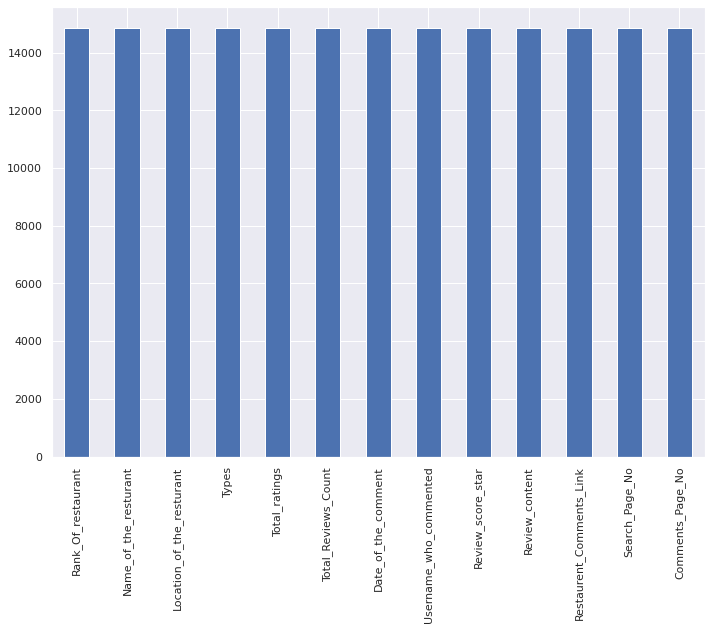

In [ ]:
df.isnull().sum().plot.bar()

We remove the null values

In [ ]:
df = df[df['Review_content'].notna()]


We plot again, we find no null values in our dataset :


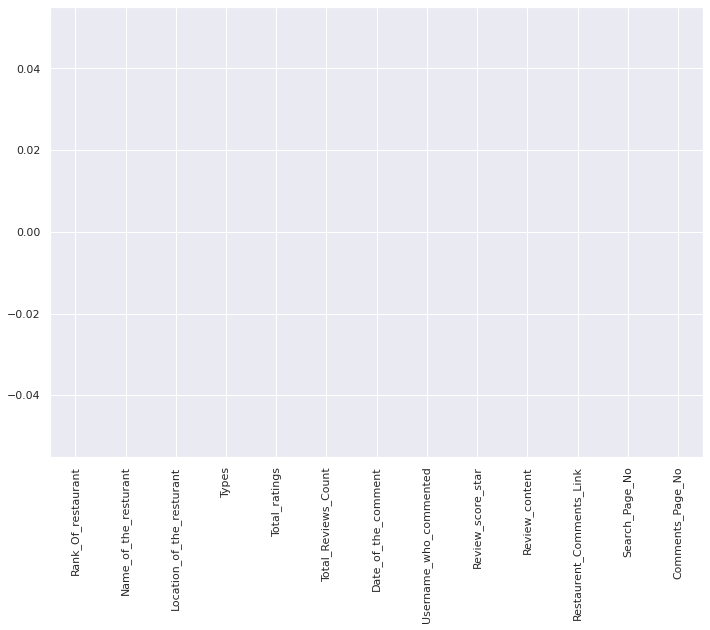

In [ ]:
df.isnull().sum().plot.bar()

The Number of reviews for each restaurent

In [ ]:
df['Name_of_the_resturant'].value_counts()

Han no Daidokoro Kadochika                              1581
Hakushu - Kobe Teppanyaki                                914
Yakiniku a Five Toku Ginza8chome                         774
Han no Daidokoro Honten                                  729
Kobe Beef 511                                            588
Gyuan                                                    482
Meat Yazawa Tokyo Gotanda Honten                         270
Wolfgang's Steakhouse by Wolfgang Zwiener Roppongi       257
Lawry's the Prime Rib, Ebisu                             209
Wolfgang's Steakhouse by Wolfgang Zwiener Marunouchi     202
Ikuta                                                    190
Outback Steakhouse Shinagawatakanawa                     190
Ikinari Steak Shinjuku Nichome                           172
Beefsteak Kawamura Tokyo Ginza                           160
Metropolitan Grill                                       138
RRR Kobe Beef Steak                                      113
Kudara                  

We plot this result

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


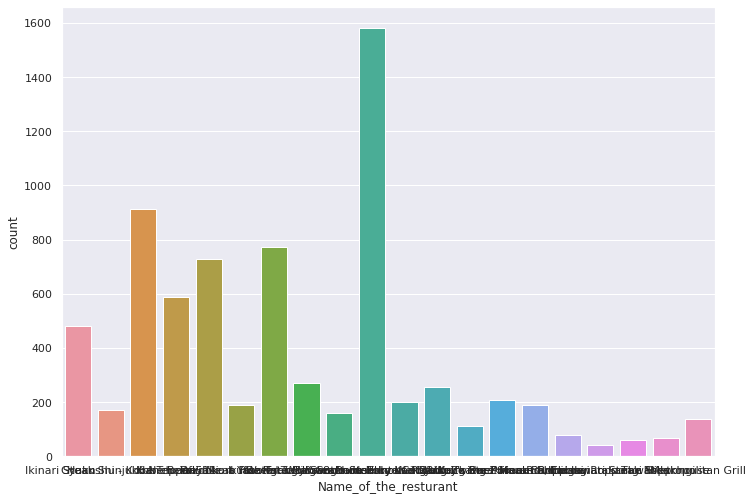

In [ ]:
sns.countplot(df['Name_of_the_resturant'])

We get the rank for each restaurent :

In [ ]:
Rests_by_ranks = (df.groupby(by=["Name_of_the_resturant"]).mean()[["Rank_Of_restaurant"]].sort_values(by="Rank_Of_restaurant", ascending = True))
Rests_by_ranks

,Rank_Of_restaurant
Name_of_the_resturant,
Gyuan,1.0
Ikinari Steak Shinjuku Nichome,2.0
Hakushu - Kobe Teppanyaki,3.0
Kobe Beef 511,4.0
Han no Daidokoro Honten,5.0
Ikuta,6.0
Yakiniku a Five Toku Ginza8chome,7.0
Meat Yazawa Tokyo Gotanda Honten,8.0
Beefsteak Kawamura Tokyo Ginza,9.0


We plot the result

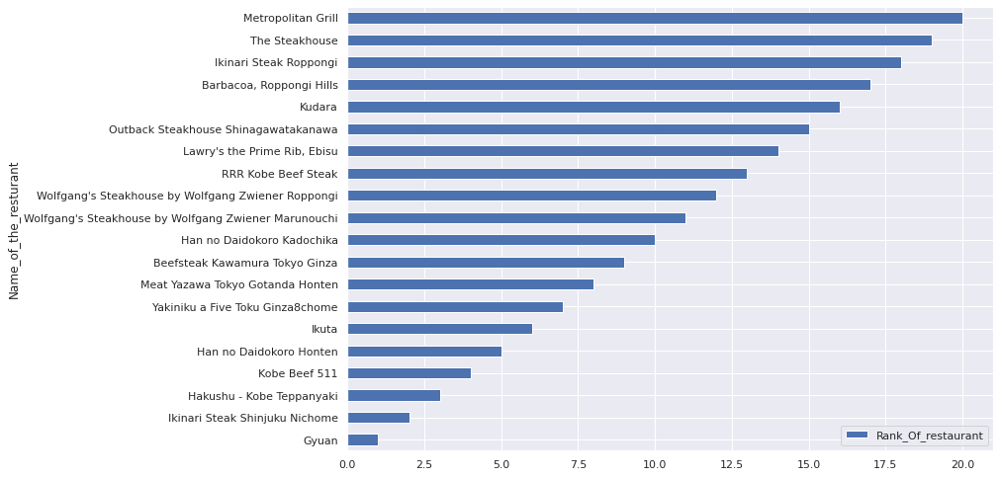

In [ ]:
Rests_by_ranks.plot.barh(stacked=True)

We get the mean of the rating for each restaurent :

In [ ]:
Restaurants_by_rating = (df.groupby(by=["Name_of_the_resturant"]).mean()[["Total_ratings"]].sort_values(by="Total_ratings", ascending = True))
Restaurants_by_rating



,Total_ratings
Name_of_the_resturant,
"Barbacoa, Roppongi Hills",4.0
Wolfgang's Steakhouse by Wolfgang Zwiener Marunouchi,4.0
The Steakhouse,4.0
Outback Steakhouse Shinagawatakanawa,4.0
Ikinari Steak Roppongi,4.0
Meat Yazawa Tokyo Gotanda Honten,4.0
"Lawry's the Prime Rib, Ebisu",4.0
Wolfgang's Steakhouse by Wolfgang Zwiener Roppongi,4.0
RRR Kobe Beef Steak,4.5


We plot the result

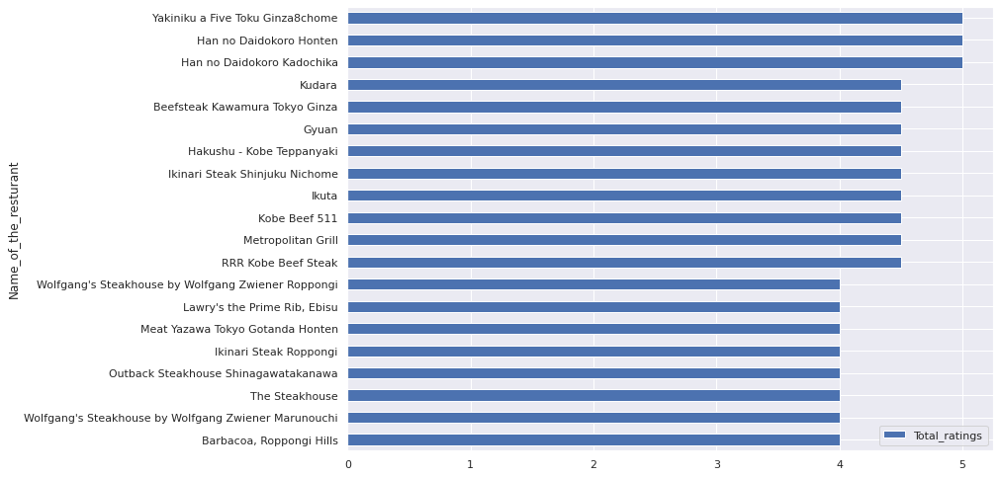

In [ ]:
Restaurants_by_rating.plot.barh(stacked=True)

Review Count for each restaurant

In [ ]:
Restaurants_by_n_reviews = (df.groupby(by=["Name_of_the_resturant"]).mean()[["Total_Reviews_Count"]].sort_values(by="Total_Reviews_Count", ascending = True))
Restaurants_by_n_reviews

,Total_Reviews_Count
Name_of_the_resturant,
Ikinari Steak Roppongi,59.0
Kudara,80.0
RRR Kobe Beef Steak,109.0
"Barbacoa, Roppongi Hills",115.0
The Steakhouse,136.0
Metropolitan Grill,138.0
Beefsteak Kawamura Tokyo Ginza,155.0
Ikuta,160.0
Ikinari Steak Shinjuku Nichome,161.0


Plotting the results

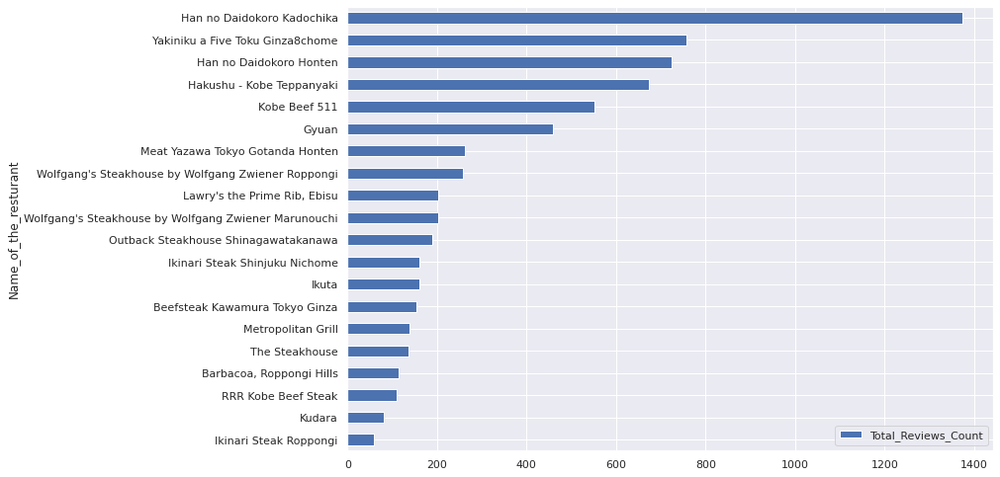

In [ ]:
Restaurants_by_n_reviews.plot.barh(stacked=True)

Number of occurences of reviews in each Location

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


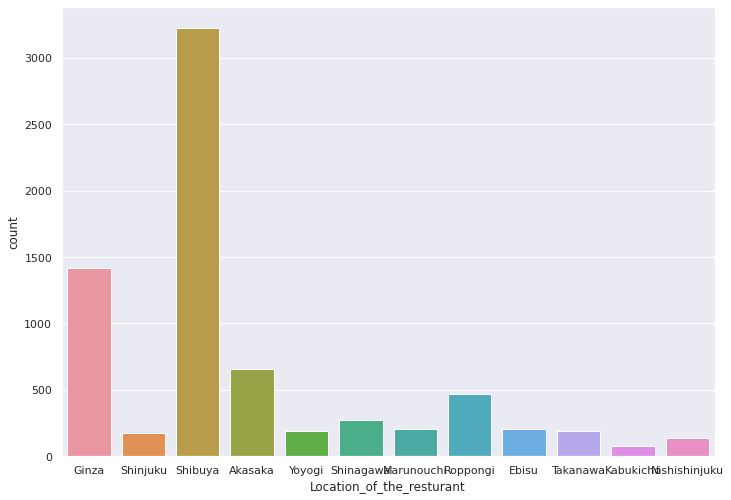

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})

sns.countplot(df['Location_of_the_resturant'])


We see the results in a dataframe

In [ ]:
Location_by_n_reviews = (df.groupby(by=["Location_of_the_resturant"]).mean()[["Total_Reviews_Count"]].sort_values(by="Total_Reviews_Count", ascending = True))
Location_by_n_reviews

,Total_Reviews_Count
Location_of_the_resturant,
Kabukicho,80.000000
Nishishinjuku,138.000000
Yoyogi,160.000000
Shinjuku,161.000000
Roppongi,184.174468
Takanawa,190.000000
Ebisu,202.000000
Marunouchi,202.000000
Shinagawa,263.000000


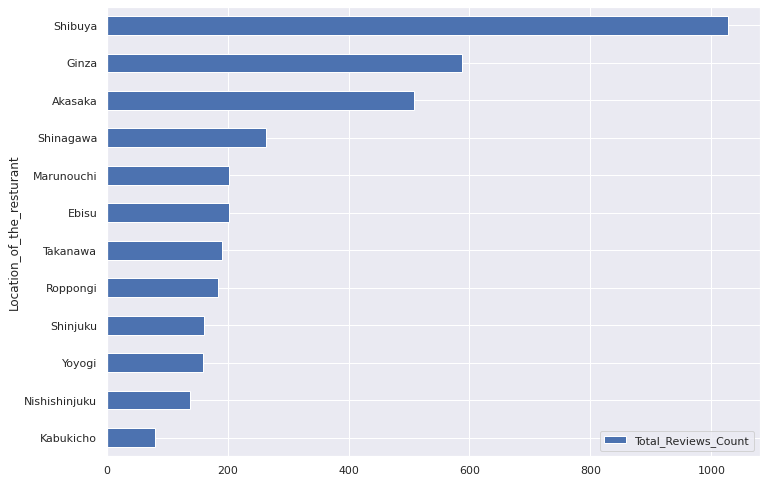

In [ ]:
Location_by_n_reviews.plot.barh(stacked=True)

Our dataset :

Plotting the count of each star review

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


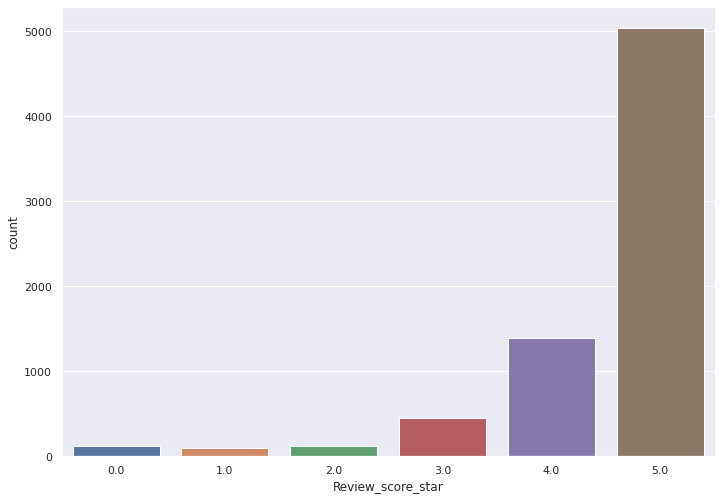

In [ ]:
sns.countplot(df['Review_score_star'])

## Stacked Charts

Restaurant Name/ Location :


In [ ]:
df_locations = df[["Name_of_the_resturant","Location_of_the_resturant","Total_Reviews_Count"]]
df_locations = df_locations.drop_duplicates()


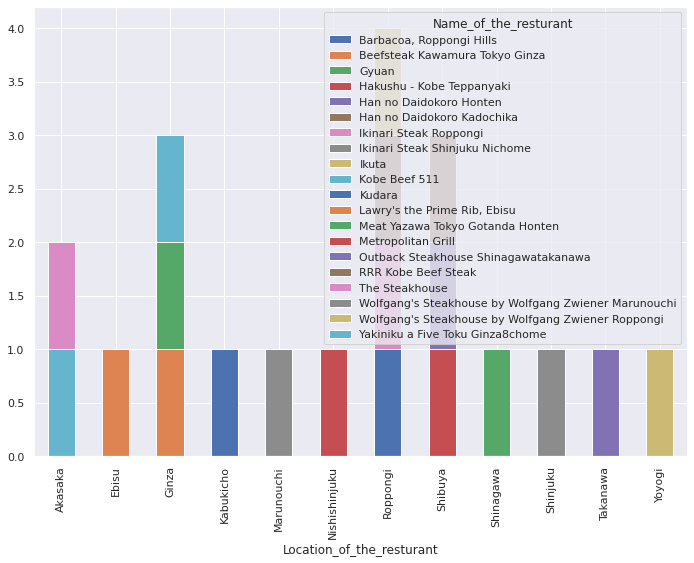

In [ ]:
df_locations.groupby(['Location_of_the_resturant', 'Name_of_the_resturant']).size().unstack().plot(kind='bar', stacked=True)


Name restaurant / lang

In [ ]:
!pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 981 kB 6.4 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=153b574e2abb12b91a50c5430b251676d49e2ead9c62c8d3e904ae097a28b74f
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect


In [ ]:
#detect lang and %
from langdetect import detect
def detect_my(text):
   try:
       return detect(text)
   except:
       return 'unknown'

df['langue_code'] = df['Review_content'].apply(detect_my)

In [ ]:
df_langs = df[["Name_of_the_resturant","langue_code","Total_Reviews_Count"]]
df_langs

,Name_of_the_resturant,langue_code,Total_Reviews_Count
0,Gyuan,en,458.0
1,Gyuan,ja,458.0
2,Gyuan,ja,458.0
3,Gyuan,en,458.0
4,Gyuan,en,458.0
...,...,...,...
7212,Metropolitan Grill,ja,138.0
7213,Metropolitan Grill,en,138.0
7214,Metropolitan Grill,en,138.0
7215,Metropolitan Grill,ja,138.0


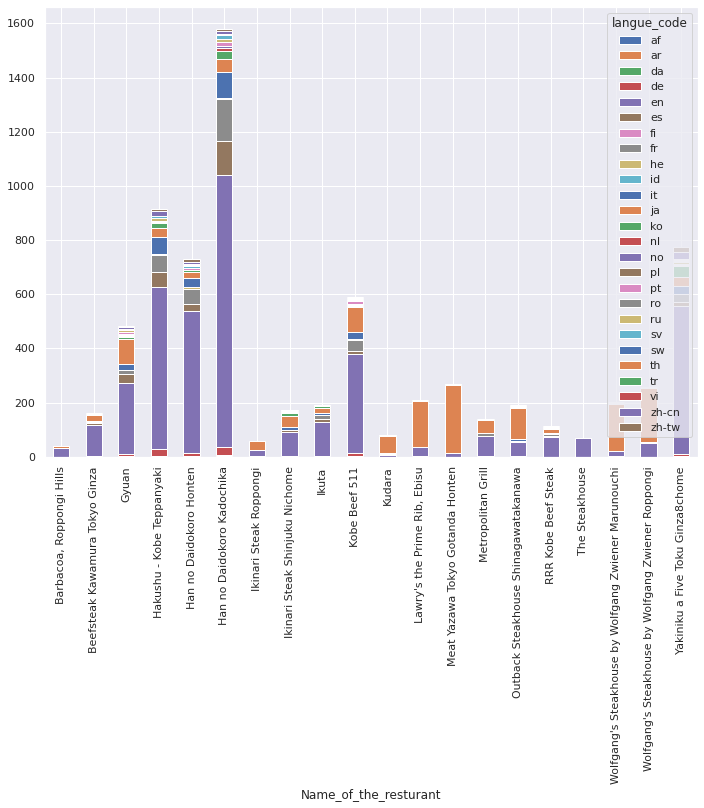

In [ ]:
df_langs.groupby([ 'Name_of_the_resturant',"langue_code"]).size().unstack().plot(kind='bar', stacked=True)


# Data Preprocessing : 

We add a column "is bad review" contains reviews with less than 2 stars

In [ ]:
df["is_bad_review"] = df["Review_score_star"].apply(lambda x: 1 if x < 2 else 0)
df.head()

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,Restaurent_Comments_Link,Search_Page_No,Comments_Page_No,langue_code,is_bad_review
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0,en,0
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0,ja,0
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0,ja,0
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0,en,0
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,/Restaurant_Review-g14129573-d1677235-Reviews-...,1.0,1.0,en,0


We count the bad and not bad reviews :    
- 0 is a good review
- 1 is a bad review

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


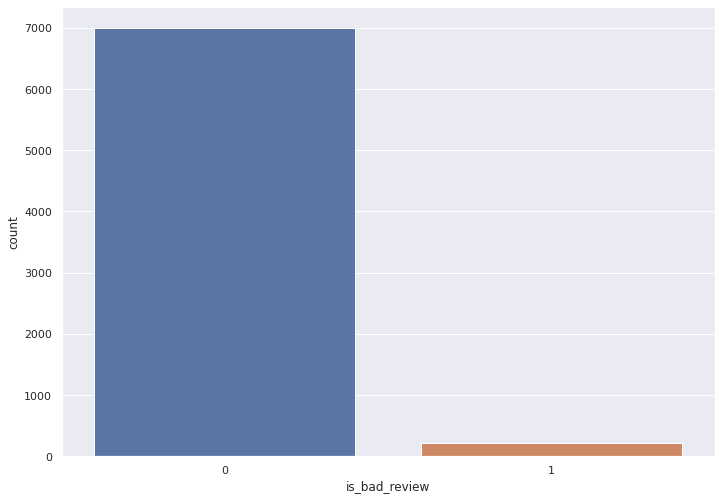

In [ ]:
sns.countplot(df['is_bad_review'])

We read data for translated content

In [ ]:
df1 = pd.read_csv("Comments.csv")
df["Trans_content"] = df1["Trans_content"]

Cleaning the review content and creating a column for reviews that are clean

In [ ]:
# return the wordnet object value corresponding to the POS tag
from nltk.corpus import wordnet

def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
import nltk
import string
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download("stopwords")
def clean_text(text):
    # lower text
    text = text.lower()
    # tokenize text and remove puncutation
    text = [word.strip(string.punctuation) for word in text.split(" ")]
    # remove words that contain numbers
    text = [word for word in text if not any(c.isdigit() for c in word)]
    # remove stop words
    stop = stopwords.words('english')
    text = [x for x in text if x not in stop]
    # remove empty tokens
    text = [t for t in text if len(t) > 0]
    # pos tag text
    pos_tags = pos_tag(text)
    # lemmatize text
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    # remove words with only one letter
    text = [t for t in text if len(t) > 1]
    # join all
    text = " ".join(text)
    return(text)

# clean text data
df["review_clean"] = df["Trans_content"].apply(lambda x: clean_text(x))

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


We add four columns for Vader Sentiment analysis these columns are :     
- pos
- neg
- neu
- compound

to know more about this values here is a link : https://www.geeksforgeeks.org/python-sentiment-analysis-using-vader/

In [ ]:
# add sentiment anaylsis columns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
df["sentiments"] = df["Trans_content"].apply(lambda x: sid.polarity_scores(x))
df = pd.concat([df.drop(['sentiments'], axis=1), df['sentiments'].apply(pd.Series)], axis=1)

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Create two column for the number of characters and the number of words

In [ ]:
# add number of characters column
df["nb_chars"] = df["review_clean"].apply(lambda x: len(x))

# add number of words column
df["nb_words"] = df["review_clean"].apply(lambda x: len(x.split(" ")))

The next step consist in extracting vector representations for every review. The module Gensim creates a numerical vector representation of every word in the corpus by using the contexts in which they appear (Word2Vec). This is performed using shallow neural networks. What's interesting is that similar words will have similar representation vectors.

Each text can also be transformed into numerical vectors using the word vectors (Doc2Vec). Same texts will also have similar representations and that is why we can use those vectors as training features.

We first have to train a Doc2Vec model by feeding in our text data. By applying this model on our reviews, we can get those representation vectors.



In [ ]:
# create doc2vec vector columns
from gensim.test.utils import common_texts
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(df["review_clean"].apply(lambda x: x.split(" ")))]

# train a Doc2Vec model with our text data
model = Doc2Vec(documents, vector_size=5, window=2, min_count=1, workers=4)

# transform each document into a vector data
doc2vec_df = df["review_clean"].apply(lambda x: model.infer_vector(x.split(" "))).apply(pd.Series)
doc2vec_df.columns = ["doc2vec_vector_" + str(x) for x in doc2vec_df.columns]
df = pd.concat([df, doc2vec_df], axis=1)

In [ ]:
df

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,...,neu,pos,compound,nb_chars,nb_words,doc2vec_vector_0,doc2vec_vector_1,doc2vec_vector_2,doc2vec_vector_3,doc2vec_vector_4
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",...,0.726,0.274,0.8271,102,14,0.125260,-0.000804,0.142069,0.104564,-0.046619
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,...,0.865,0.096,0.6697,232,34,0.059659,0.201280,0.105276,0.014681,-0.035344
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,...,0.732,0.268,0.7459,90,13,-0.001438,-0.034358,0.021013,-0.063975,0.014411
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,...,0.766,0.234,0.8581,101,15,0.034375,0.140850,-0.087347,0.020572,-0.189927
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,...,0.710,0.232,0.7667,99,17,0.044029,0.085897,0.066522,-0.129021,-0.165678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7212,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"March 25, 2015",miy3103,5.0,オーストラリア産のお肉とは思えない柔らかさのお肉でした。\nお肉の種類に加えて、シーフードメ...,...,0.940,0.060,0.2023,119,16,-0.038214,0.233052,0.141630,0.055934,-0.144905
7213,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"March 18, 2015",Tom H,4.0,If you're looking for an outstanding tradition...,...,0.843,0.157,0.6476,94,12,0.160031,-0.030077,-0.076126,-0.051991,-0.114965
7214,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"March 5, 2015",kh214,4.0,"Great wine list and service was top notch, fri...",...,0.566,0.434,0.9442,129,19,0.080973,0.042446,0.023690,0.231020,-0.244018
7215,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"February 5, 2015",Fearless805364,5.0,２時間制のバイキングですが、並んでいる料理を自分で取るスタイルではなくて、ランチバイキング用...,...,0.795,0.205,0.9847,377,58,-0.173845,0.294156,0.369751,0.268428,0.097973


Adding tf-idfs columns to our dataset :     

 we add the TF-IDF (Term Frequency - Inverse Document Frequency) values for every word and every document.

But why not simply counting how many times each word appears in every document? The problem with this method is that it doesn't take into account the relative importance of words in the texts. A word that appears in almost every text would not likely bring useful information for analysis. On the contrary, rare words may have a lot more of meanings.

The TF-IDF metric solves this problem:

TF computes the classic number of times the word appears in the text
IDF computes the relative importance of this word which depends on how many texts the word can be found
We add TF-IDF columns for every word that appear in at least 10 different texts to filter some of them and reduce the size of the final output.

In [ ]:
# add tf-idfs columns
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(min_df = 10)
tfidf_result = tfidf.fit_transform(df["review_clean"]).toarray()
tfidf_df = pd.DataFrame(tfidf_result, columns = tfidf.get_feature_names())
tfidf_df.columns = ["word_" + str(x) for x in tfidf_df.columns]
tfidf_df.index = df.index
df = pd.concat([df, tfidf_df], axis=1)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
df

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,...,word_year,word_yen,word_yes,word_yet,word_york,word_you,word_young,word_your,word_yoyogi,word_yummy
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.353354
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7212,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"March 25, 2015",miy3103,5.0,オーストラリア産のお肉とは思えない柔らかさのお肉でした。\nお肉の種類に加えて、シーフードメ...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
7213,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"March 18, 2015",Tom H,4.0,If you're looking for an outstanding tradition...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
7214,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"March 5, 2015",kh214,4.0,"Great wine list and service was top notch, fri...",...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
7215,20.0,Metropolitan Grill,Nishishinjuku,"American, Steakhouse",4.5,138.0,"February 5, 2015",Fearless805364,5.0,２時間制のバイキングですが、並んでいる料理を自分で取るスタイルではなくて、ランチバイキング用...,...,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000


We see that a big number of columns is been added to our dataset each column represents a word and how much it is represented in our dataset

In [ ]:
df.columns

Index(['Rank_Of_restaurant', 'Name_of_the_resturant',
       'Location_of_the_resturant', 'Types', 'Total_ratings',
       'Total_Reviews_Count', 'Date_of_the_comment', 'Username_who_commented',
       'Review_score_star', 'Review_content',
       ...
       'word_year', 'word_yen', 'word_yes', 'word_yet', 'word_york',
       'word_you', 'word_young', 'word_your', 'word_yoyogi', 'word_yummy'],
      dtype='object', length=1715)

## Word Clouds

Word clouds for the whole reviews :

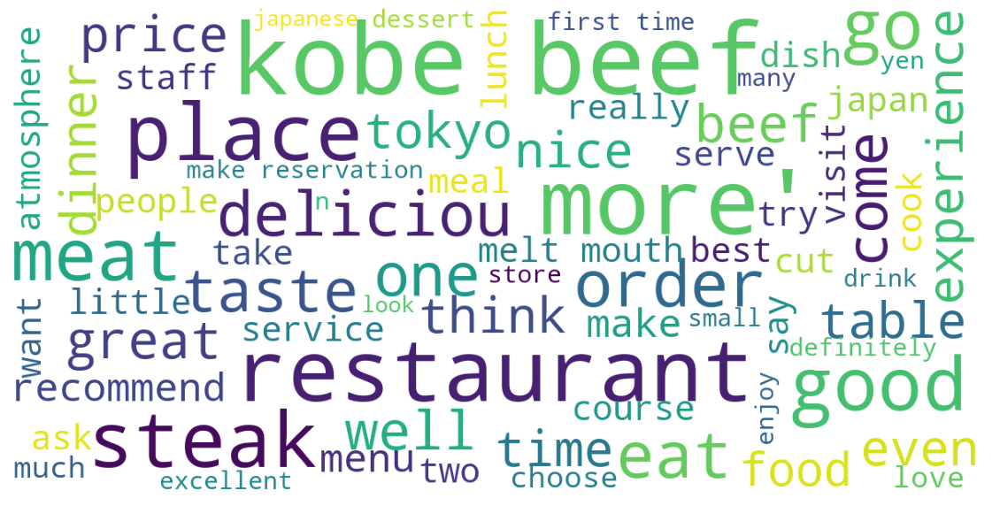

In [ ]:
# wordcloud function

from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 70,
        max_font_size = 40, 
        scale = 3,
        random_state = 42
    ).generate(str(data))

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()
    
# print wordcloud
show_wordcloud(df.review_clean.to_list())


Word cloud in positive reviews according to the star reviews

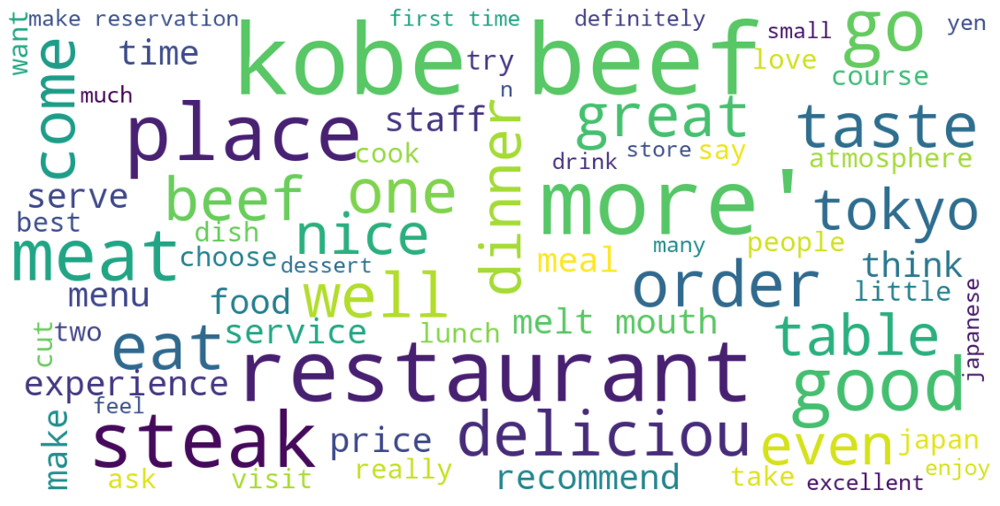

In [ ]:
#positive reviews wordcloud
show_wordcloud(df["review_clean"][df['is_bad_review']==0].to_list())


Word cloud in negative reviews according to the star reviews

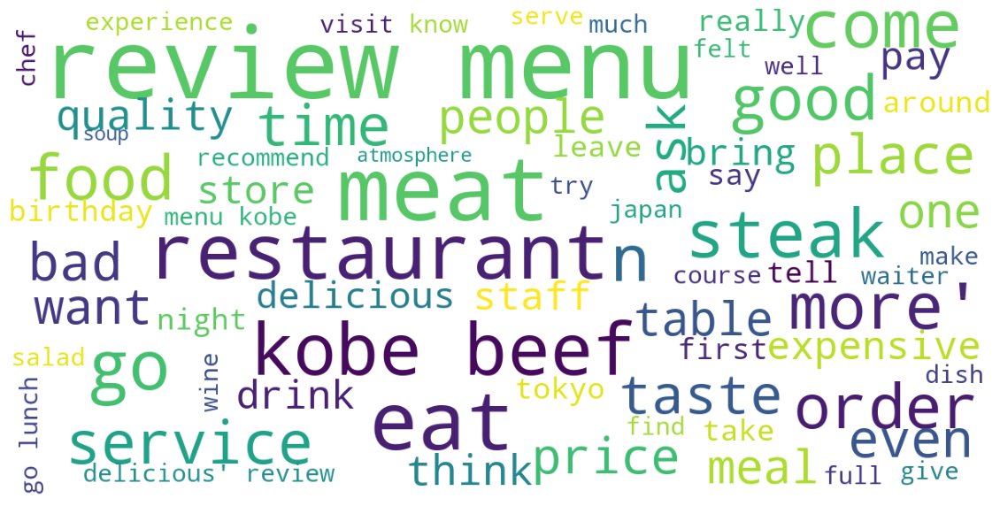

In [ ]:
#negative reviews word cloud
show_wordcloud(df["review_clean"][df['is_bad_review']==1].to_list())


In [ ]:
df["review_clean"][df['is_bad_review']==1]

41      disappoint soon walk someone start scream “sho...
53      come highly acclaimed kobe beef leave utterly ...
97      business trip search recommend lunch visit ord...
110     second time travel tojapan.both time stay mont...
118     business trip group cozy place order set menu ...
                              ...                        
7013    i'm complainer make exception steak order eat ...
7015    husband colleague excite restaurant order serv...
7082    go eat dinner metropolitan gril jan wife son o...
7096    stop try place person desk insist try lounge d...
7128    hi all,we worst restaurant experience metropol...
Name: review_clean, Length: 222, dtype: object

We show the word cloud for the most negative reviews according to the value "neg" that we got from Vader model, and combine this with the criteria that these reviews should have is_bad_review = 1

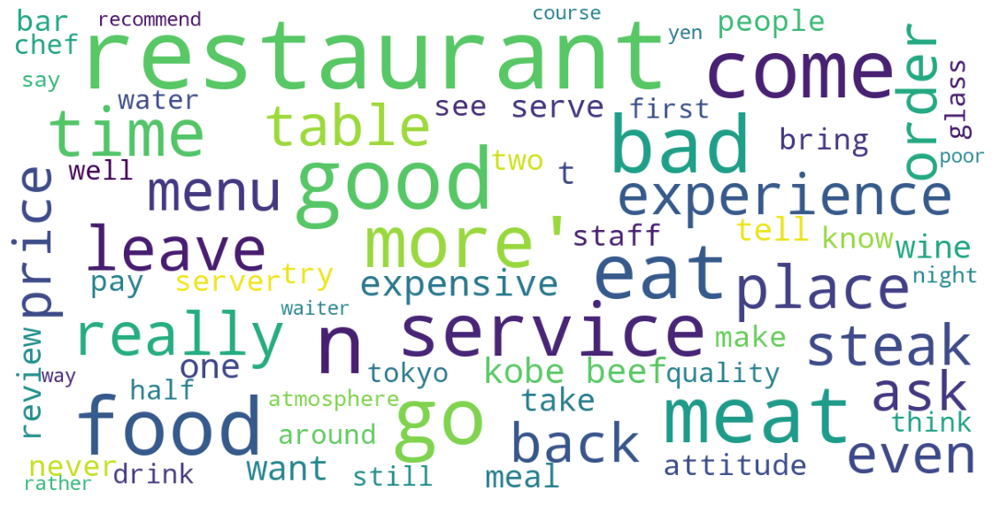

In [ ]:
tr = df.sort_values("neg", ascending = False)[["review_clean","is_bad_review"]].head(400)
show_wordcloud(tr["review_clean"][df['is_bad_review']==1].to_list())

### word clouds for each restaurant

In [ ]:
len(df.Name_of_the_resturant.unique().tolist())

20

For the restaurant :  Gyuan


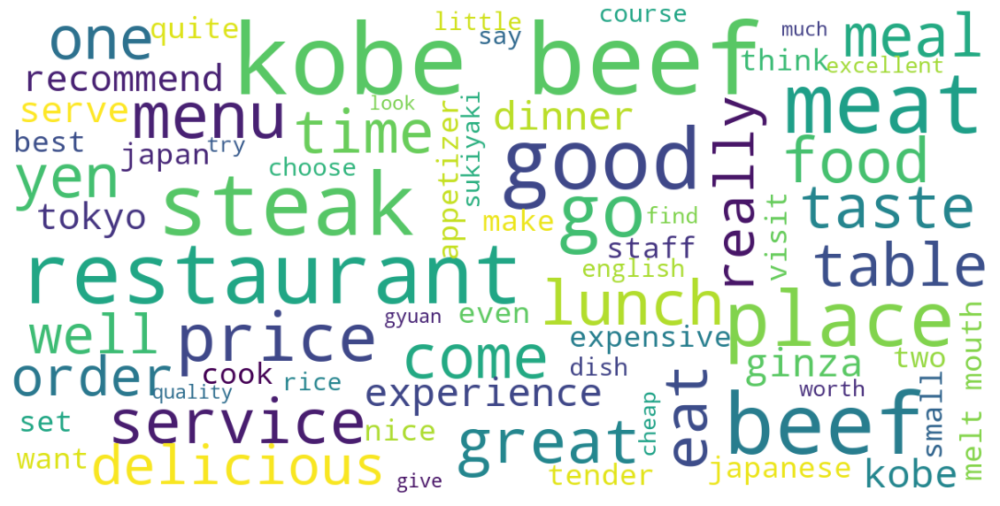

----------------------------------------------
For the restaurant :  Ikinari Steak Shinjuku Nichome


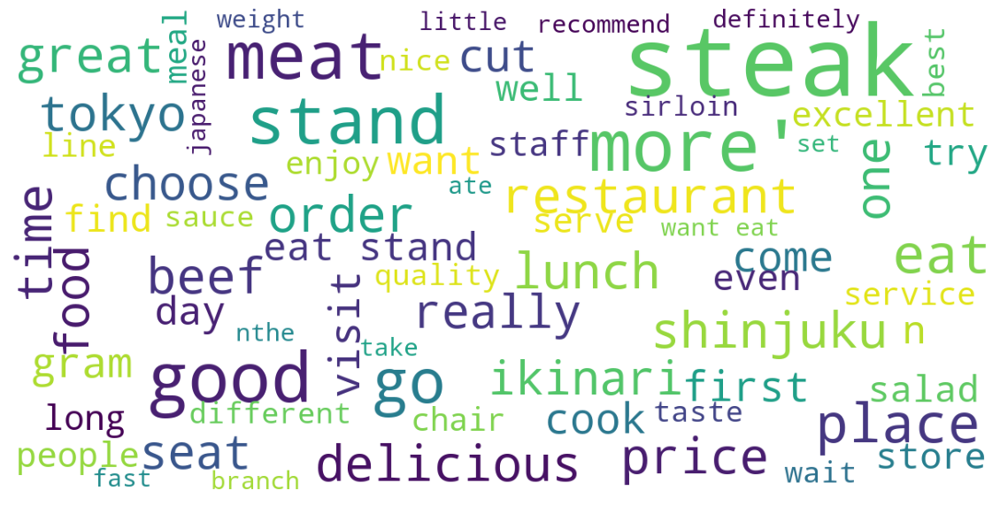

----------------------------------------------
For the restaurant :  Hakushu - Kobe Teppanyaki


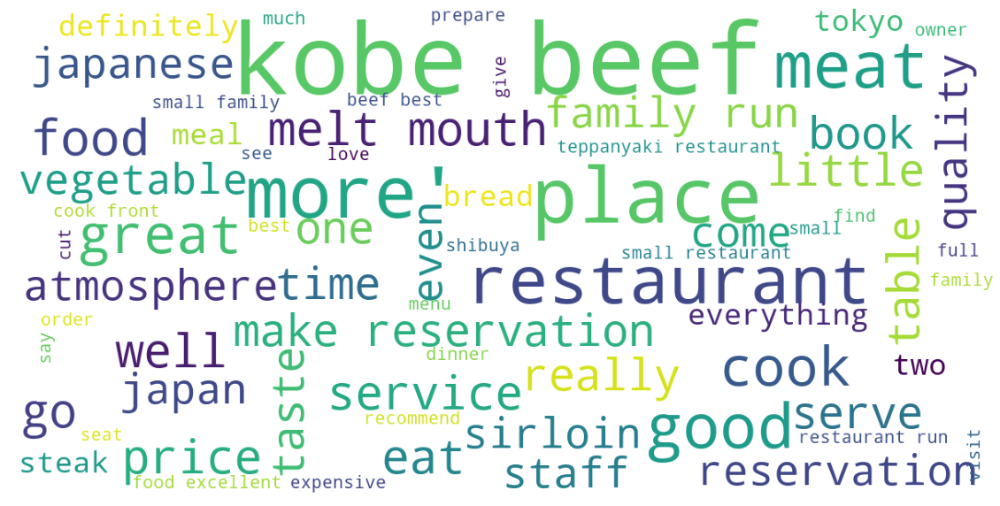

----------------------------------------------
For the restaurant :  Kobe Beef 511


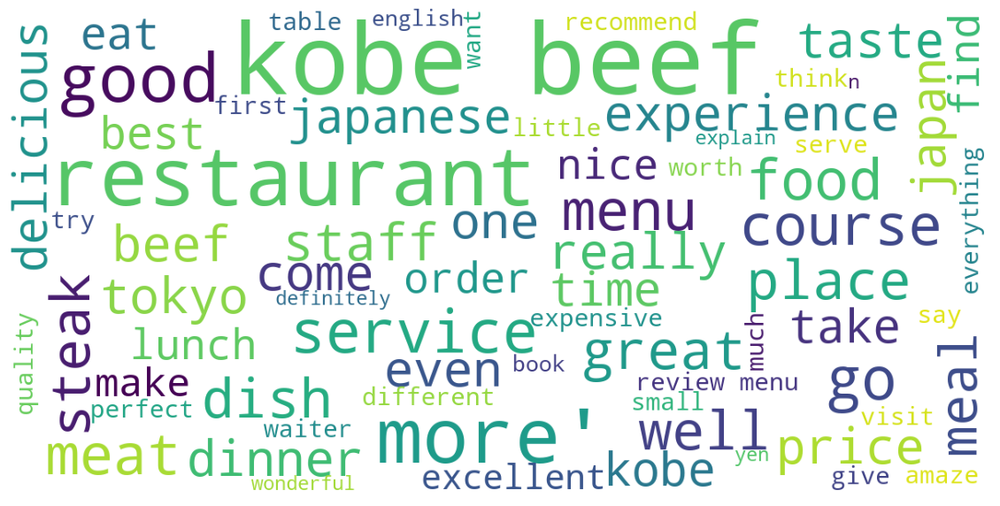

----------------------------------------------
For the restaurant :  Han no Daidokoro Honten


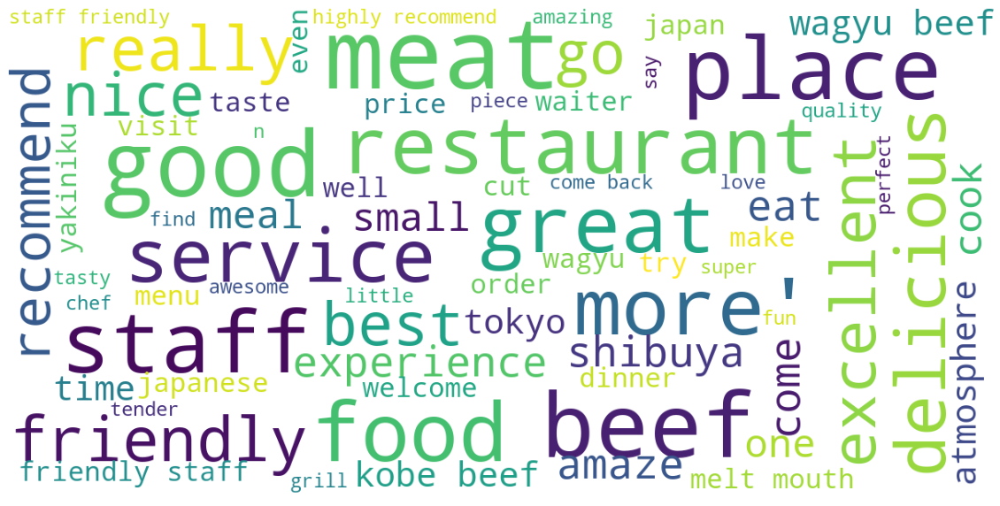

----------------------------------------------
For the restaurant :  Ikuta


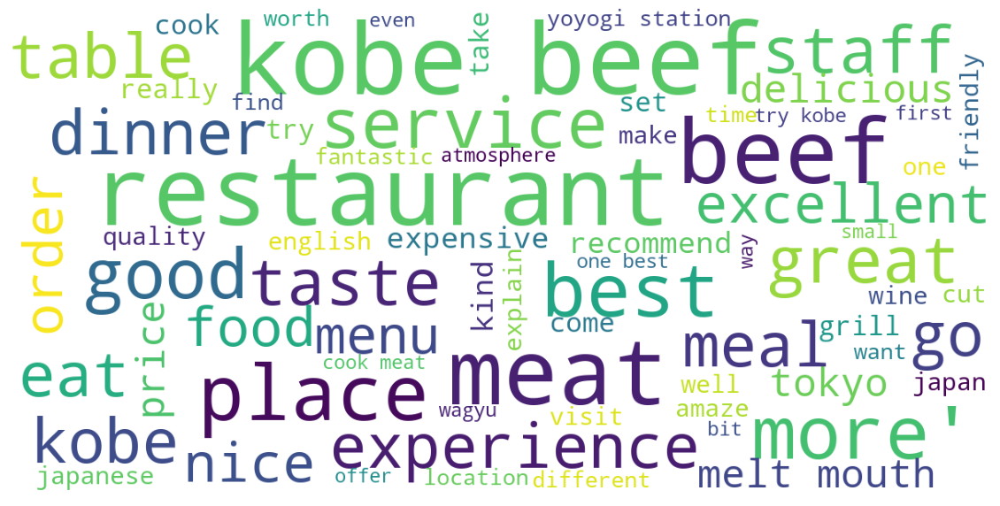

----------------------------------------------
For the restaurant :  Yakiniku a Five Toku Ginza8chome


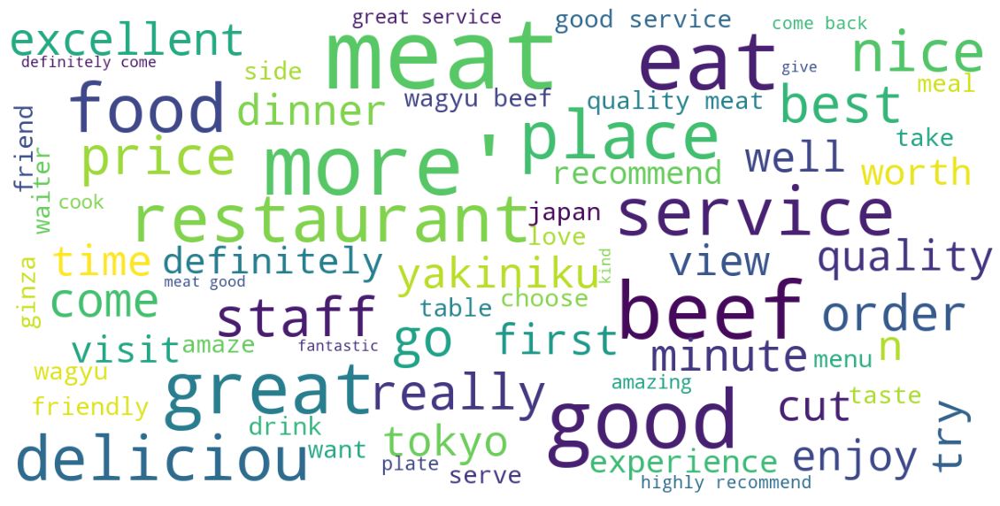

----------------------------------------------
For the restaurant :  Meat Yazawa Tokyo Gotanda Honten


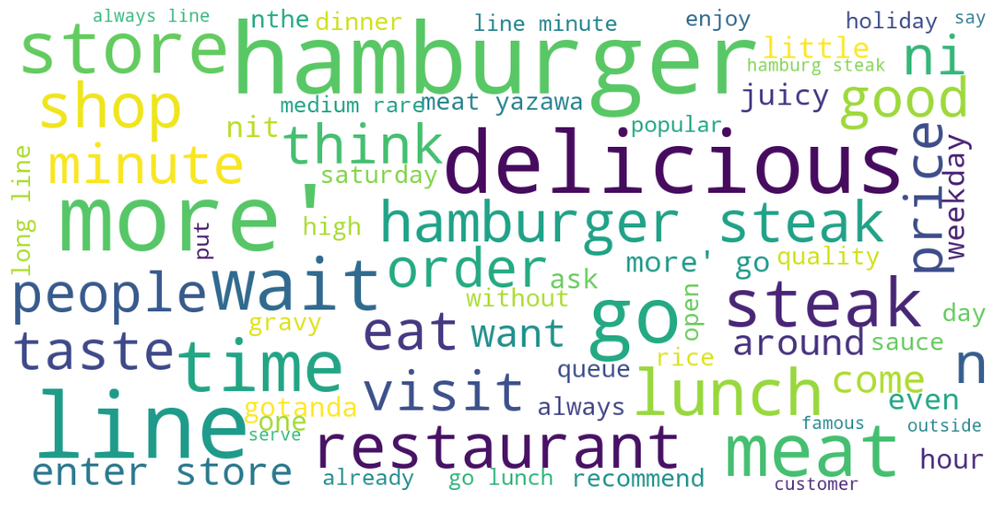

----------------------------------------------
For the restaurant :  Beefsteak Kawamura Tokyo Ginza


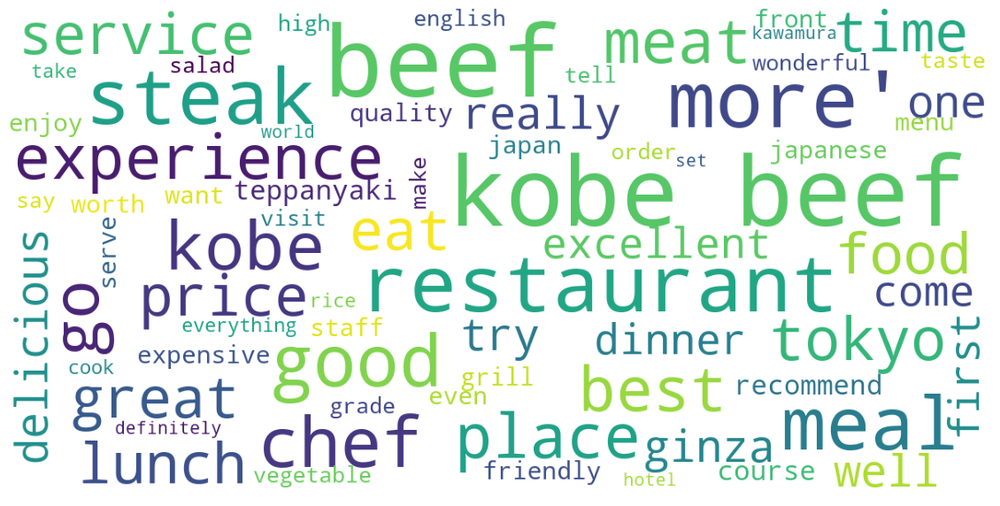

----------------------------------------------
For the restaurant :  Han no Daidokoro Kadochika


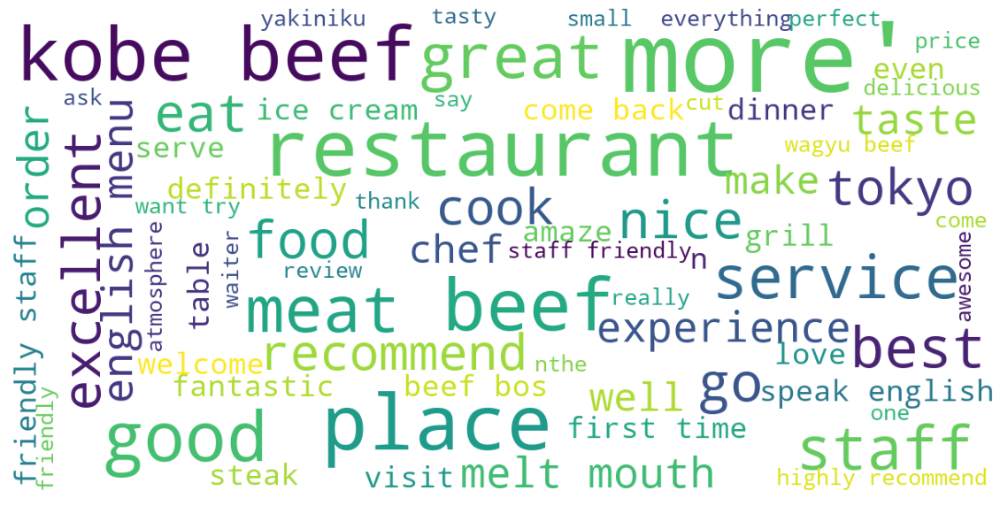

----------------------------------------------
For the restaurant :  Wolfgang's Steakhouse by Wolfgang Zwiener Marunouchi


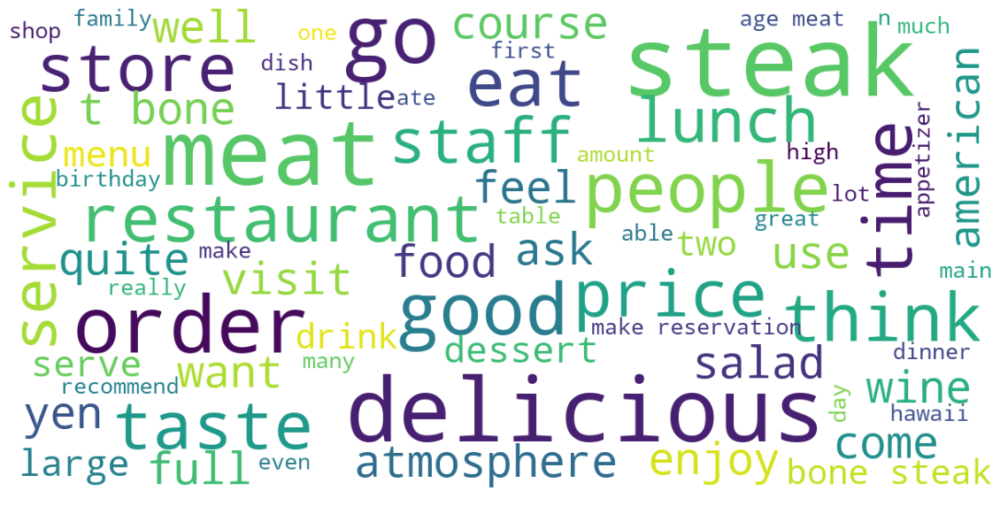

----------------------------------------------
For the restaurant :  Wolfgang's Steakhouse by Wolfgang Zwiener Roppongi


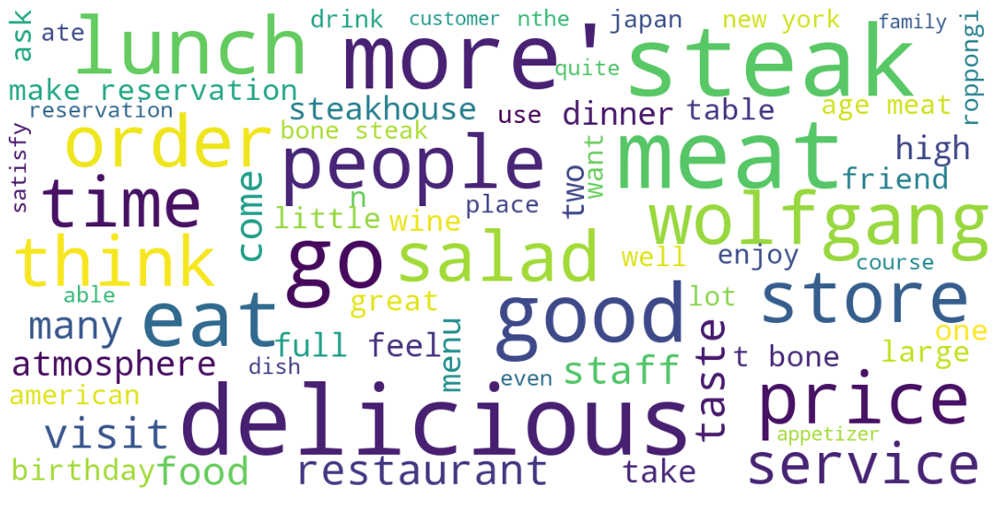

----------------------------------------------
For the restaurant :  RRR Kobe Beef Steak


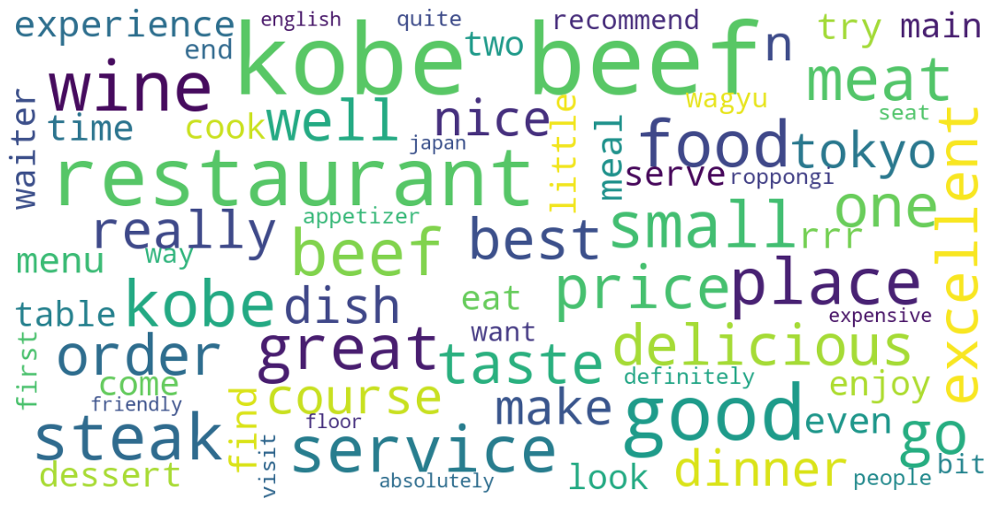

----------------------------------------------
For the restaurant :  Lawry's the Prime Rib, Ebisu


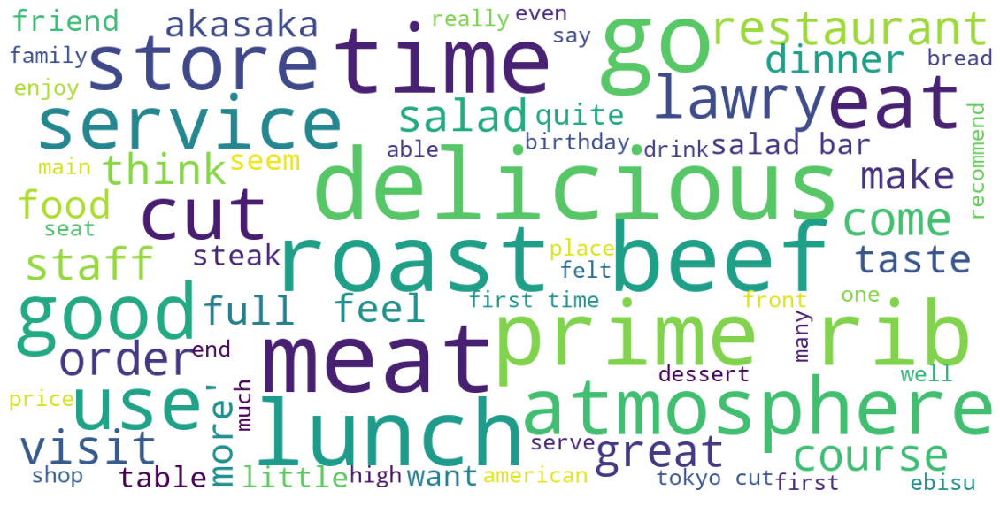

----------------------------------------------
For the restaurant :  Outback Steakhouse Shinagawatakanawa


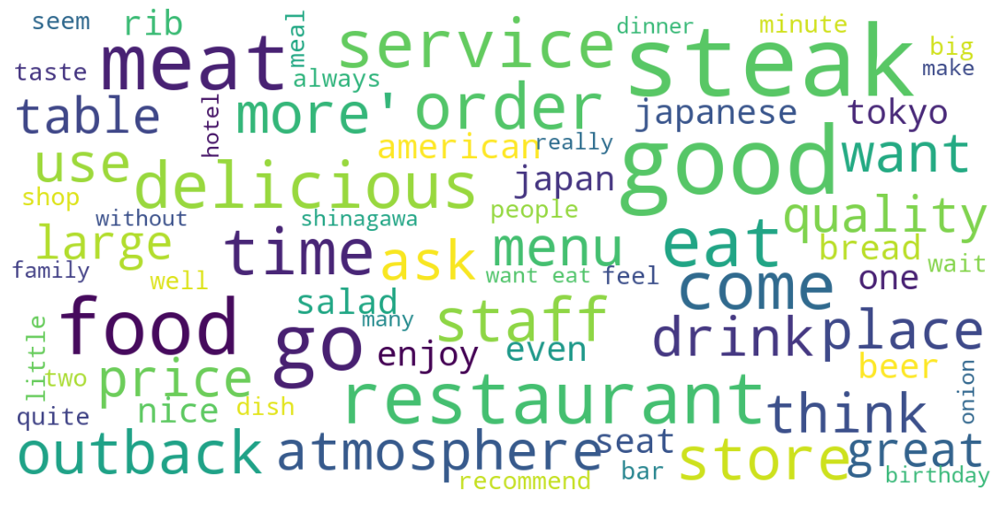

----------------------------------------------
For the restaurant :  Kudara


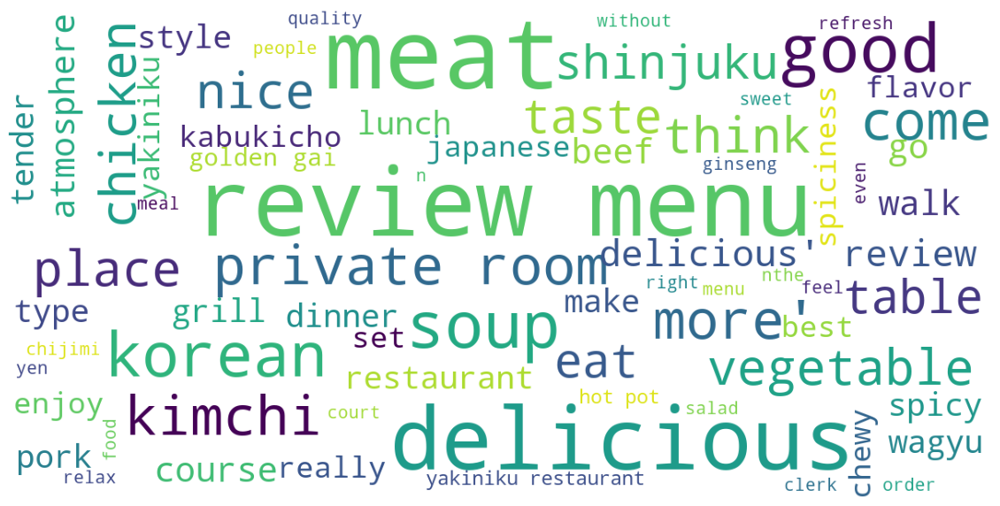

----------------------------------------------
For the restaurant :  Barbacoa, Roppongi Hills


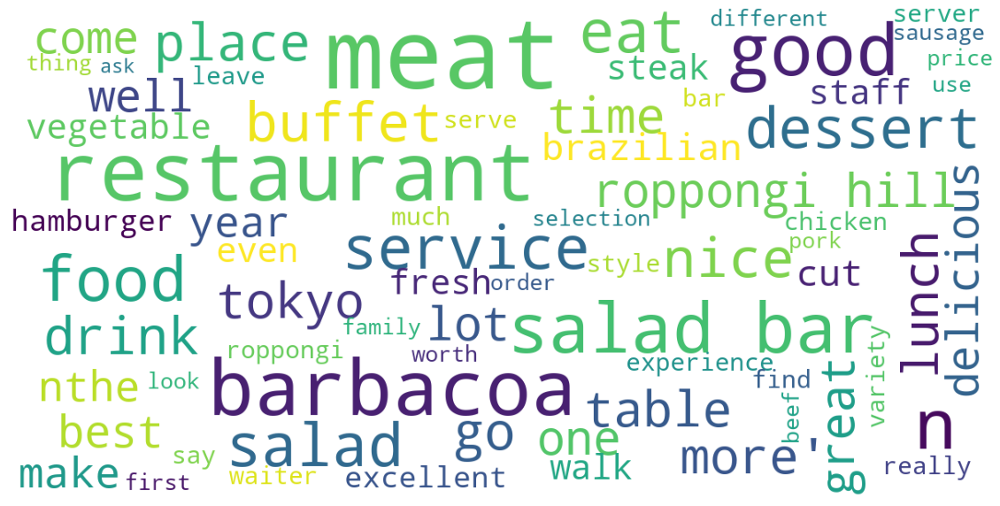

----------------------------------------------
For the restaurant :  Ikinari Steak Roppongi


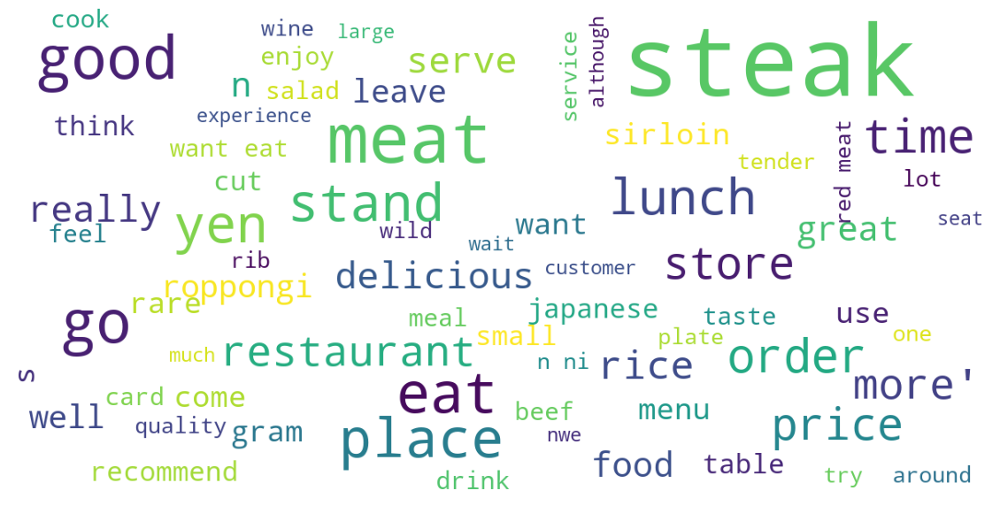

----------------------------------------------
For the restaurant :  The Steakhouse


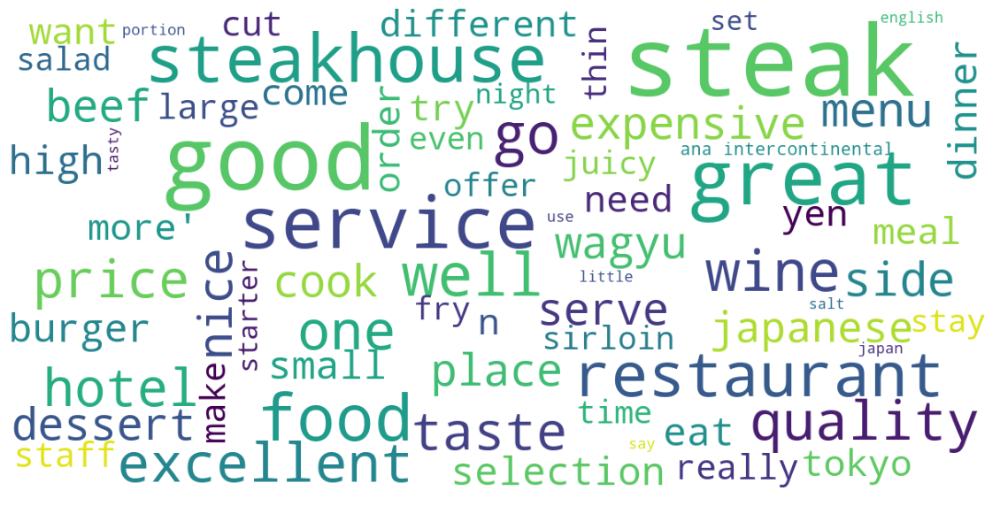

----------------------------------------------
For the restaurant :  Metropolitan Grill


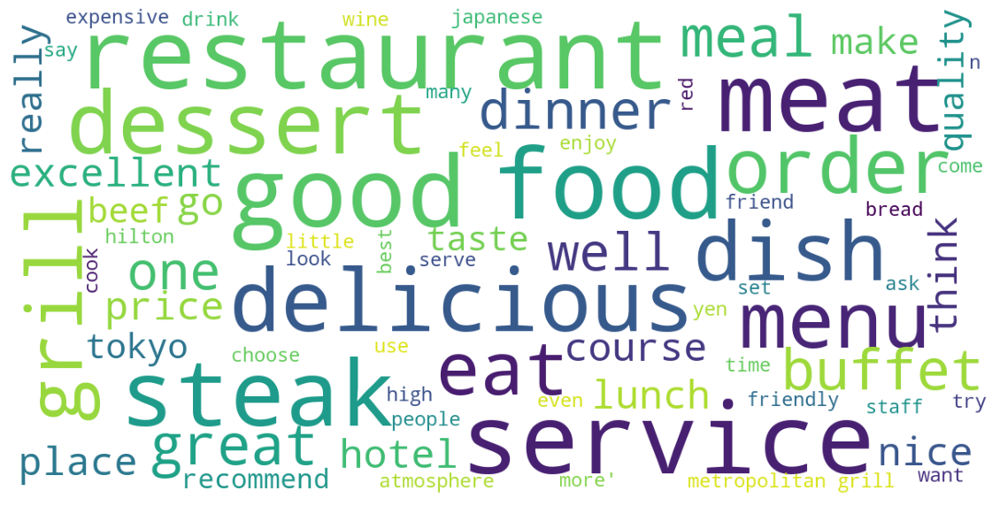

----------------------------------------------


In [ ]:
list_restaurants = df.Name_of_the_resturant.unique().tolist()

for restaurant in list_restaurants :
  df_r = df[df["Name_of_the_resturant"] == restaurant]
  print("For the restaurant : ", restaurant)
  show_wordcloud(df_r.review_clean.to_list())
  print("----------------------------------------------")

##Positive and negative reviews

In [ ]:
# highest positive sentiment reviews (with more than 5 words)
df[df["nb_words"] >= 5].sort_values("pos", ascending = False)[["review_clean", "pos"]].head(10)

,review_clean,pos
5679,service courtesy friendliness quality........\...,0.786
3665,amaze food great service great relaxed environ...,0.736
4764,great food great stage great location recommen...,0.717
4665,excellent super place\nrecommended also speak ...,0.713
4890,staff super friendly food amazing fun experien...,0.701
5120,excellent great experience great meat well fri...,0.696
4510,marvelous excellent food courteous friendly st...,0.692
2595,magnificent restaurant!\ninformal relax atmosp...,0.690
3771,good beef good beef good service price...more,0.685
3293,delicious excellent service friendly staff ate...,0.679


In [ ]:
# lowest negative sentiment reviews (with more than 5 words)
df[df["nb_words"] >= 5].sort_values("neg", ascending = False)[["review_clean", "neg"]].head(10)

,review_clean,neg
3711,probably bad meal i’ve travel eat give bad cut...,0.346
3106,tasty put meat as beautiful view waiter lose a...,0.332
3147,fair meat inadequate waiter high price unrelax...,0.318
1830,disappointed service good food good except kob...,0.301
4829,go meat meal disappoint good meat good staff.....,0.286
2864,despite good quality meat disappoint minimal q...,0.269
904,nothing short heavenly kobe meat really nice j...,0.266
4737,restaurant basement noisy bad service poor men...,0.261
4803,i'm big meat lover usually eat visit japan can...,0.260
3085,good all-you-can-eat meat take snack quality s...,0.245


## Vader's compatibility with the star review column in our dataset

In [ ]:
df["compound"]

0       0.8271
1       0.6697
2       0.7459
3       0.8581
4       0.7667
         ...  
7212    0.2023
7213    0.6476
7214    0.9442
7215    0.9847
7216    0.9939
Name: compound, Length: 7217, dtype: float64

The graph here shows the distribution of the reviews sentiments among good reviews and bad ones. We can see that good reviews are for most of them considered as very positive by Vader. On the contrary, bad reviews tend to have lower compound sentiment scores.


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


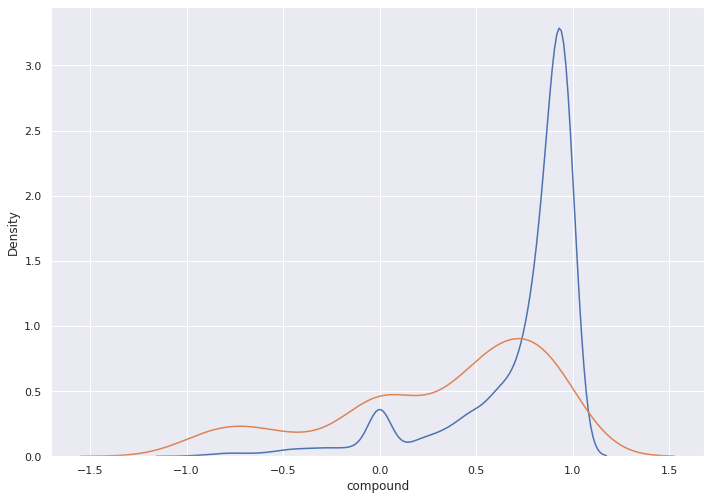

In [ ]:
for x in [0, 1]:
    subset = df[df['is_bad_review'] == x]
    
    # Draw the density plot
    if x == 0:
        label = "Good reviews"
    else:
        label = "Bad reviews"
    sns.distplot(subset['compound'], hist = False, label = label)

#Splitting Data : Train/Test

In [ ]:
# feature selection
# creating a variable label 
label = "is_bad_review"
# create var ignor_columns
ignore_cols = [label, "langue_code","Review_content", "review_clean","Name_of_the_resturant","Location_of_the_resturant","Types","Date_of_the_comment","Username_who_commented","Comments_Page_No","Trans_content","Restaurent_Comments_Link"]
features = [c for c in df.columns if c not in ignore_cols]

# split the data into train and test
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[label], test_size = 0.50, random_state = 42)

# Training a RandomForest Model Classifier

## Random Forest Model first version

In [ ]:
df.columns[0:30]

Index(['Rank_Of_restaurant', 'Name_of_the_resturant',
       'Location_of_the_resturant', 'Types', 'Total_ratings',
       'Total_Reviews_Count', 'Date_of_the_comment', 'Username_who_commented',
       'Review_score_star', 'Review_content', 'Restaurent_Comments_Link',
       'Search_Page_No', 'Comments_Page_No', 'langue_code', 'is_bad_review',
       'Trans_content', 'review_clean', 'neg', 'neu', 'pos', 'compound',
       'nb_chars', 'nb_words', 'doc2vec_vector_0', 'doc2vec_vector_1',
       'doc2vec_vector_2', 'doc2vec_vector_3', 'doc2vec_vector_4',
       'word_abalone', 'word_able'],
      dtype='object')

In [ ]:
# train a random forest classifier
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
rf.fit(X_train, y_train)

# show feature importance
feature_importances_df = pd.DataFrame({"feature": features, "importance": rf.feature_importances_}).sort_values("importance", ascending = False)
feature_importances_df.head(30)

,feature,importance
3,Review_score_star,0.297870
1226,word_review,0.048020
8,compound,0.015504
925,word_menu,0.011757
265,word_chicken,0.011338
1369,word_soup,0.010966
1565,word_umami,0.010234
1114,word_pot,0.010202
2,Total_Reviews_Count,0.010056
0,Rank_Of_restaurant,0.009261


In [ ]:
from sklearn.metrics import accuracy_score , classification_report ,confusion_matrix
y_pred = rf.predict(X_test)
print("Classification Report", classification_report(y_test,y_pred))

Classification Report               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3494
           1       1.00      1.00      1.00       115

    accuracy                           1.00      3609
   macro avg       1.00      1.00      1.00      3609
weighted avg       1.00      1.00      1.00      3609



##Random forest second version as asked in the request

Encoding the location 

In [ ]:
df.columns[0:30]

Index(['Rank_Of_restaurant', 'Name_of_the_resturant',
       'Location_of_the_resturant', 'Types', 'Total_ratings',
       'Total_Reviews_Count', 'Date_of_the_comment', 'Username_who_commented',
       'Review_score_star', 'Review_content', 'Restaurent_Comments_Link',
       'Search_Page_No', 'Comments_Page_No', 'langue_code', 'is_bad_review',
       'Trans_content', 'review_clean', 'neg', 'neu', 'pos', 'compound',
       'nb_chars', 'nb_words', 'doc2vec_vector_0', 'doc2vec_vector_1',
       'doc2vec_vector_2', 'doc2vec_vector_3', 'doc2vec_vector_4',
       'word_abalone', 'word_able'],
      dtype='object')

In [ ]:
df["Location_of_the_resturant"] = df["Location_of_the_resturant"].astype('category')

In [ ]:
df["Location_of_the_resturant_cat"] = df["Location_of_the_resturant"].cat.codes
df.head()

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,...,word_yen,word_yes,word_yet,word_york,word_you,word_young,word_your,word_yoyogi,word_yummy,Location_of_the_resturant_cat
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.353354,2
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2


In [ ]:
df["Location_of_the_resturant_cat"].value_counts()

7     3224
2     1416
0      656
6      470
8      270
1      209
4      202
11     190
10     190
9      172
5      138
3       80
Name: Location_of_the_resturant_cat, dtype: int64

Label encoding for Types:

In [ ]:
df["Types"] = df["Types"].astype('category')

In [ ]:
df["Types_cat"] = df["Types"].cat.codes
df.head()

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,...,word_yes,word_yet,word_york,word_you,word_young,word_your,word_yoyogi,word_yummy,Location_of_the_resturant_cat,Types_cat
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.353354,2,4
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4


Label encoding for languages

In [ ]:
df["langue_code"] = df["langue_code"].astype('category')

In [ ]:
df["langue_code_cat"] = df["langue_code"].cat.codes
df.head()

,Rank_Of_restaurant,Name_of_the_resturant,Location_of_the_resturant,Types,Total_ratings,Total_Reviews_Count,Date_of_the_comment,Username_who_commented,Review_score_star,Review_content,...,word_yet,word_york,word_you,word_young,word_your,word_yoyogi,word_yummy,Location_of_the_resturant_cat,Types_cat,langue_code_cat
0,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 25, 2020",Bradle27,5.0,"The beef was yummy, interior was traditional j...",...,0.0,0.0,0.0,0.0,0.0,0.0,0.353354,2,4,4
1,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 17, 2020",odenden,5.0,ランチタイムには激安で神戸牛を使用したハンバーグが楽しめるお店です。\n行列が出来るうえに、...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4,11
2,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"March 5, 2020",toshiakit17,5.0,ランチのサービスステーキがおすすめです。ハンバーグもおすすめですが、数量が決まってますので、...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4,11
3,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 27, 2020",Pinglebakk,5.0,Never eaten Kobe steak before and this was a f...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4,4
4,1.0,Gyuan,Ginza,"Japanese, Steakhouse",4.5,458.0,"January 7, 2020",Randy D,4.0,Best meat I’ve ever had. Hands down. Portions ...,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,2,4,4


We should always ignore the review columns because they can't be processed they are a text and the information inside of them is in the columns of tf-idf

In [ ]:
# feature selection
# creating a variable label 
label = "is_bad_review"
# create var ignor_columns
ignore_cols = [label,"langue_code", "Types","Location_of_the_resturant","Review_content", "review_clean","Name_of_the_resturant","Date_of_the_comment","Username_who_commented","Comments_Page_No","Trans_content","Restaurent_Comments_Link"]
features = [c for c in df.columns if c not in ignore_cols]

# split the data into train and test
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[label], test_size = 0.50, random_state = 42)

print the new feature importance table

In [ ]:
# train a random forest classifier
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
rf.fit(X_train, y_train)

# show feature importance
feature_importances_df = pd.DataFrame({"feature": features, "importance": rf.feature_importances_}).sort_values("importance", ascending = False)
feature_importances_df.head(30)

,feature,importance
3,Review_score_star,0.290056
1226,word_review,0.050210
925,word_menu,0.022056
8,compound,0.013760
1369,word_soup,0.010227
13,doc2vec_vector_2,0.010072
2,Total_Reviews_Count,0.009884
9,nb_chars,0.009487
7,pos,0.009389
1565,word_umami,0.009276


In [ ]:
from sklearn.metrics import accuracy_score , classification_report ,confusion_matrix
y_pred = rf.predict(X_test)
print("Classification Report", classification_report(y_test,y_pred))

Classification Report               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3494
           1       1.00      0.97      0.99       115

    accuracy                           1.00      3609
   macro avg       1.00      0.99      0.99      3609
weighted avg       1.00      1.00      1.00      3609



# Other algorithms/Feature Importance/PCA :    


Following your request to do other algos than random forests

First of all our model isn't too much overfitting because it tested perfectly in our dataset, however due to the dataset's lack of negative reviews it might score good easily.

Let's try for example the model of Decision Trees :

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
# feature selection
# creating a variable label 
label = "is_bad_review"
# create var ignor_columns
ignore_cols = [label,"Review_score_star","langue_code", "Types","Location_of_the_resturant","Review_content", "review_clean","Name_of_the_resturant","Date_of_the_comment","Username_who_commented","Comments_Page_No","Trans_content","Restaurent_Comments_Link"]
features = [c for c in df.columns if c not in ignore_cols]

# split the data into train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[label], test_size = 0.50, random_state = 42)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model_dt = DecisionTreeClassifier()
# fit the model
model_dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
feature_importances_df = pd.DataFrame({"feature": features, "importance": model_dt.feature_importances_}).sort_values("importance", ascending = False)
feature_importances_df.head(30)

,feature,importance
1225,word_review,0.202507
924,word_menu,0.132547
7,compound,0.062570
1564,word_umami,0.036887
9,nb_words,0.034857
457,word_eat,0.023028
14,doc2vec_vector_4,0.021327
649,word_go,0.020061
593,word_food,0.018965
696,word_head,0.018822


In [ ]:
y_pred = model_dt.predict(X_test)
print("Classification Report", classification_report(y_test,y_pred))

Classification Report               precision    recall  f1-score   support

           0       0.99      0.98      0.98      3494
           1       0.47      0.58      0.52       115

    accuracy                           0.97      3609
   macro avg       0.73      0.78      0.75      3609
weighted avg       0.97      0.97      0.97      3609



We get 97% accuracy

In [ ]:
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[3418   76]
 [  48   67]]


Our model is great but it's clear from the confusion matrix that the fact that the bad reviews are not much is affecting the accuracy

In [ ]:
from sklearn.svm import LinearSVC


In [ ]:
terms_train=list(df['review_clean'][0:4000])
class_train=list(df[label][0:4000])

terms_test=list(df['review_clean'][4000:7000])
class_test=list(df[label][4000:7000])

In [ ]:
## get bag of words : the frequencies of various words appeared in each review
vectorizer = CountVectorizer()
feature_train_counts=vectorizer.fit_transform(terms_train)
feature_train_counts.shape

(4000, 5862)

In [ ]:

## run model
svm = LinearSVC()
svm.fit(feature_train_counts, class_train)

LinearSVC()

In [ ]:
## create dataframe for score of each word in a review calculated by svm model
coeff = svm.coef_[0]
Rests_words_score = pd.DataFrame({'score': coeff, 'word': vectorizer.get_feature_names()})

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
## get frequency of each word in all reviews in specific category
reviews = pd.DataFrame(feature_train_counts.toarray(), columns=vectorizer.get_feature_names())
reviews[label] = class_train
frequency = reviews[reviews[label] ==0].sum()[:-1]

In [ ]:
Rests_words_score.set_index('word', inplace=True)


In [ ]:
Rests_polarity_score = Rests_words_score
Rests_polarity_score['frequency'] = frequency

In [ ]:
Rests_polarity_score['polarity'] = Rests_polarity_score.score * Rests_polarity_score.frequency / reviews.shape[0]


In [ ]:
Rests_polarity_score.polarity = Rests_polarity_score.polarity.astype(float)
Rests_polarity_score.frequency = Rests_polarity_score.frequency.astype(float)

In [ ]:
Rests_polarity_score[Rests_polarity_score.polarity>0].sort_values('polarity', ascending=False)[:20]


,score,frequency,polarity
word,,,
menu,0.354198,587.0,0.051979
review,0.721085,198.0,0.035694
eat,0.162417,797.0,0.032362
make,0.144946,504.0,0.018263
mouth,0.190261,381.0,0.018122
give,0.282302,207.0,0.014609
serve,0.166341,343.0,0.014264
want,0.152559,360.0,0.013730
must,0.206930,230.0,0.011898


In [ ]:
Rests_polarity_score[Rests_polarity_score.polarity<0].sort_values('polarity', ascending=True)[:20]


,score,frequency,polarity
word,,,
great,-0.297381,960.0,-0.071371
kobe,-0.129590,1917.0,-0.062106
good,-0.155889,1497.0,-0.058341
recommend,-0.285841,803.0,-0.057383
staff,-0.215120,827.0,-0.044476
friendly,-0.269852,579.0,-0.039061
one,-0.258324,531.0,-0.034292
best,-0.188849,705.0,-0.033285
melt,-0.365843,362.0,-0.033109


In [ ]:
# I picked the moste relevant words with the highest polarity score both positive and negative

Rests_top_positive_words = ['menu','review','serve','beef','sauce','expensive','salad','plate']
Rests_top_negative_words = ['kobe','good','recommend','friendly','staff', 'worth', 'delicious','restaurant','english']
Rests_top_words = Rests_polarity_score.loc[Rests_top_positive_words+Rests_top_negative_words,'polarity']

(array([-0.08, -0.06, -0.04, -0.02,  0.  ,  0.02,  0.04,  0.06]),
 <a list of 8 Text major ticklabel objects>)

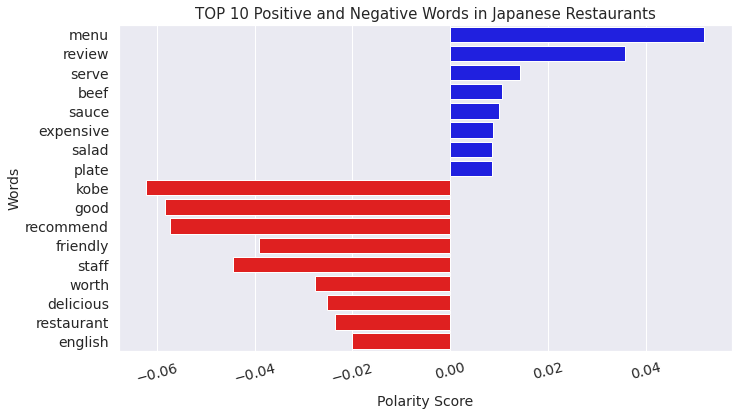

In [ ]:
plt.figure(figsize=(11,6))
colors = ['red' if c < 0 else 'blue' for c in Rests_top_words.values]
sns.barplot(y=Rests_top_words.index, x=Rests_top_words.values, palette=colors)
plt.xlabel('Polarity Score', labelpad=10, fontsize=14)
plt.ylabel('Words', fontsize=14)
plt.title('TOP 10 Positive and Negative Words in Japanese Restaurants', fontsize=15)
plt.tick_params(labelsize=14)
plt.xticks(rotation=15)

## PCA

In [ ]:
from sklearn.decomposition import PCA

pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [ ]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([8.69354709e-01, 1.30381758e-01, 1.00702168e-04, ...,
       3.29608496e-41, 2.11052228e-41, 8.95904334e-42])

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=1)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [ ]:

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

cm = confusion_matrix(y_test, y_pred)
print(cm)
print('Accuracy', accuracy_score(y_test, y_pred))

[[3488    6]
 [ 107    8]]
Accuracy 0.9686893876420061


In [ ]:
# feature selection
label = "is_bad_review"
ignore_cols = [label,"langue_code", "Review_content", "review_clean","Name_of_the_resturant","Location_of_the_resturant","Types","Date_of_the_comment","Username_who_commented","Comments_Page_No","Trans_content","Restaurent_Comments_Link","Sentiment"]
features = [c for c in df.columns if c not in ignore_cols]

# split the data into train and test
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[label], test_size = 0.50, random_state = 42)
from sklearn.decomposition import PCA



In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [ ]:

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)


# Predicting the Test set results
y_pred = classifier.predict(X_test)

In [ ]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print('Accuracy', accuracy_score(y_test, y_pred))

[[3494    0]
 [ 115    0]]
Accuracy 0.9681352175117761


In [ ]:
df.columns[0:35]

Index(['Rank_Of_restaurant', 'Name_of_the_resturant',
       'Location_of_the_resturant', 'Types', 'Total_ratings',
       'Total_Reviews_Count', 'Date_of_the_comment', 'Username_who_commented',
       'Review_score_star', 'Review_content', 'Restaurent_Comments_Link',
       'Search_Page_No', 'Comments_Page_No', 'langue_code', 'is_bad_review',
       'Trans_content', 'review_clean', 'neg', 'neu', 'pos', 'compound',
       'nb_chars', 'nb_words', 'doc2vec_vector_0', 'doc2vec_vector_1',
       'doc2vec_vector_2', 'doc2vec_vector_3', 'doc2vec_vector_4',
       'word_abalone', 'word_able', 'word_absolute', 'word_absolutely',
       'word_accept', 'word_acceptable', 'word_accommodate'],
      dtype='object')

In [ ]:
# feature selection
label = "is_bad_review"
ignore_cols = [label, "langue_code", "Review_content", "review_clean","Name_of_the_resturant","Location_of_the_resturant","Types","Date_of_the_comment","Username_who_commented","Comments_Page_No","Trans_content","Restaurent_Comments_Link","Sentiment"]
features = [c for c in df.columns if c not in ignore_cols]

# split the data into train and test
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[label], test_size = 0.50, random_state = 42)
from sklearn.decomposition import PCA


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [ ]:

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)


# Predicting the Test set results
y_pred = classifier.predict(X_test)

In [ ]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print('Accuracy', accuracy_score(y_test, y_pred))

[[3492    2]
 [  27   88]]
Accuracy 0.9919645331116653
